In [1]:
using JuMP,Gurobi
using Ipopt
using GLPKMathProgInterface
using DataArrays, DataFrames, CSV
using Gadfly
using Pajarito 
using Pavito
using ECOS
using AmplNLWriter, CoinOptServices
using NLopt
using Mosek
using KNITRO

# Data initialization

In [2]:
#Generator's parameters

GenData = DataFrame(
    Bus = [18,21,1,2,15,16,23,23,7,13,15,22],
    Pmax = [400,400,152,152,155,155,310,350,350,591,60,300],
    Pmin = [100,100,30.40,30.40,54.25,54.25,108.50,140,75,206.85,12,0],
    Qmax = [400,400,192,192,155,155,250,310,300,591,30,300],
    Qmin = [-50,-50,-50,-50,-50,-50,-50,-125,0,0,0,-60],
    a = [0.005,0.005,0.004,0.004,0.005,0.007,0.007,0.003,0.004,0.005,0.007,0],
    b = [5.47,5.47,13.32,13.32,16,10.52,10.52,10.89,20.7,20.93,26.11,0],
    c = [89,89,100,100,53,73,73,80,83,87,53,0],
    RU = [47,47,14,14,21,21,21,28,49,21,7,35],
    RD = [47,47,14,14,21,21,21,28,49,21,7,35])

#Number of generators
NGen = size(GenData,1) 
# Generator limits
Pmin = zeros(NGen); 
Pmax = zeros(NGen); 
Qmin = zeros(NGen); 
Qmax = zeros(NGen);
# Price coefficients
c = zeros(NGen);
a = zeros(NGen);
b = zeros(NGen);
Bus = zeros(NGen);
#RumpUp
RU = zeros(NGen);
#RumpDown
RD = zeros(NGen);



for i=1:NGen
    Bus[i] = GenData[i,:Bus]
    Pmin[i] = GenData[i,:Pmin]
    Pmax[i] = GenData[i,:Pmax]
    Qmin[i] = GenData[i,:Qmin]
    Qmax[i] = GenData[i,:Qmax]
    c[i] = GenData[i,:c]
    a[i] = GenData[i,:a]
    b[i] = GenData[i,:b]
    RU[i] = GenData[i,:RU]
    RD[i] = GenData[i,:RD]
    
    
end    
    
#GenData

In [20]:
# Transmission line's parameters
BranchData = DataFrame(
    FromBus = [1,1,1,2,2,3,3,4,5,6,7,8,8,9,9,10,10,11,11,12,12,13,14,15,15,15,16,16,17,17,18,19,20,21],
    ToBus = [2,3,5,4,6,9,24,9,10,10,8,9,10,11,12,11,12,13,14,13,23,23,16,16,21,24,17,19,18,22,21,20,23,22],
    r = [0.0026,0.0546,0.0218,0.0328,0.0497,0.0308,0.0023,0.0268,0.0228,0.0139,0.0159,0.0427,0.0427,0.0023,0.0023,0.0023,0.0023,0.0061,0.0054,0.0061,0.0124,0.0111,0.0050,0.0022,0.0032,0.0067,0.0033,0.0030,0.0018,0.0135,0.0017,0.0026,0.0014,0.0087],
    x = [0.0139,0.2112,0.0845,0.1267,0.1920,0.1190,0.0839,0.1037,0.0883,0.0605,0.0614,0.1651,0.1651,0.0839,0.0839,0.0839,0.0839,0.0476,0.0418,0.0476,0.0966,0.0865,0.0389,0.0173,0.0245,0.0519,0.0259,0.0231,0.0144,0.1053,0.0130,0.0198,0.0108,0.0678],
    b = [0.4611,0.0572,0.0229,0.0343,0.0520,0.0322,0.0000,0.0281,0.0239,2.4590,0.0166,0.0447,0.0447,0.0000,0.0000,0.0000,0.0000,0.0999,0.0879,0.0999,0.2030,0.1818,0.0818,0.0364,0.2060,0.1091,0.0545,0.0485,0.0303,0.2212,0.1090,0.1666,0.0910,0.1424],
    Smax = [175,175,175,175,175,175,400,175,175,175,175,175,175,400,400,400,400,500,500,500,500,500,500,500,1000,500,500,500,500,500,1000,1000,1000,500],)

#Number of Buses
NBuses = max(maximum(BranchData[:,:FromBus]), maximum(BranchData[:,:ToBus]));
#Number of Lines
NLines = size(BranchData,1);
#calculations of admittance and impedance
BranchData[:Z]=BranchData[:r]+im*BranchData[:x];
BranchData[:Y]=1./BranchData[:Z];

Ybus = zeros(Complex,NBuses,NBuses);#Admittance matrix
Nodes = zeros(Int8,NLines,2); #node's matrix
SLmax = zeros(NLines); #line limits
x = zeros(NLines);
r = zeros(NLines);
z = zeros(NLines)


for i=1:NLines
    #Admittance matrix
    Ybus[BranchData[i,:FromBus],BranchData[i,:ToBus]]=-BranchData[i,:Y]
    Ybus[BranchData[i,:ToBus],BranchData[i,:FromBus]]=-BranchData[i,:Y]
    #Node's matrix
    Nodes[i,1] = BranchData[i,:FromBus]
    Nodes[i,2] = BranchData[i,:ToBus]
    SLmax[i] = BranchData[i,:Smax] #max line capacity
    x[i] = BranchData[i,:x] #reactance
    r[i] = BranchData[i,:r] #resistance
       
end

for i=1:NBuses
    for j=1:NLines
        if (i==BranchData[j,:FromBus])||(i==BranchData[j,:ToBus])
            Ybus[i,i]+=BranchData[j,:Y]
        end
    end
end

Gbus = real(Ybus); #conductance
Bbus = imag(Ybus); #susceptance

BranchData



,FromBus,ToBus,r,x,b,Smax,Z,Y
1,1,2,0.0026,0.0139,0.4611,175,0.0026+0.0139im,13.002-69.5104im
2,1,3,0.0546,0.2112,0.0572,175,0.0546+0.2112im,1.14738-4.43822im
3,1,5,0.0218,0.0845,0.0229,175,0.0218+0.0845im,2.86259-11.0958im
4,2,4,0.0328,0.1267,0.0343,175,0.0328+0.1267im,1.91491-7.39693im
5,2,6,0.0497,0.192,0.052,175,0.0497+0.192im,1.26354-4.88126im
6,3,9,0.0308,0.119,0.0322,175,0.0308+0.119im,2.03843-7.87577im
7,3,24,0.0023,0.0839,0.0,400,0.0023+0.0839im,0.326496-11.91im
8,4,9,0.0268,0.1037,0.0281,175,0.0268+0.1037im,2.33614-9.03946im
9,5,10,0.0228,0.0883,0.0239,175,0.0228+0.0883im,2.74146-10.6172im
10,6,10,0.0139,0.0605,2.459,175,0.0139+0.0605im,3.60715-15.7002im


In [4]:
#Node's parameters
NodesData = DataFrame(
    Pd = [108,97,180,74,71,136,125,171,175,195,0,0,265,194,317,100,0,333,181,128,0,0,0,0],
    Qd = [22,20,37,15,14,28,25,35,36,40,0,0,54,39,64,20,0,68,37,26,0,0,0,0],
    Wind = [0,0,0,0,0,0,0,200,0,0,0,0,0,0,0,0,0,0,150,0,100,0,0,0],
    SOC = [0,0,0,0,0,0,0,0,0,0,0,0,0,300,0,0,0,0,0,0,0,0,0,0],
)
#Wind(w) and Demand(d) profile
ScaleData = DataFrame(
    w = [0.0786666666666667,0.0866666666666667,0.117333333333333,0.258666666666667,0.361333333333333,0.566666666666667,0.650666666666667,0.566666666666667,0.484,0.548,0.757333333333333,0.710666666666667,0.870666666666667,0.932,0.966666666666667,1,0.869333333333333,0.665333333333333,0.656 ,0.561333333333333,0.565333333333333,0.556,0.724,0.84],
    d = [0.684511335492475,0.644122690036197,0.61306915602972,0.599733282530006,0.588874071251667,0.5980186702229,0.626786054486569,0.651743189178891,0.706039245570585,0.787007048961707,0.839016955610593,0.852733854067441,0.870642027052772,0.834254143646409,0.816536483139646,0.819394170318156,0.874071251666984,1,0.983615926843208,0.936368832158506,0.887597637645266,0.809297008954087,0.74585635359116,0.733473042484283],
)
    
T = size(ScaleData,1); #Time scale
# Demand
Pload = zeros(NBuses); 
Qload = zeros(NBuses); 

Wind = zeros(NBuses); #Wind turbaine capacity
SOC_cap = zeros(NBuses); #ESS capacity

w = zeros(T); #Wind profile coefficients
d = zeros(T);  #Demand profile coefficients


for i=1:NBuses
    
    Pload[i] = NodesData[i,:Pd]
    Qload[i] = NodesData[i,:Qd]
    Wind[i] = NodesData[i,:Wind]
    SOC_cap[i] = NodesData[i,:SOC]
   
end

for i=1:T
    w[i] = ScaleData[i,:w]
    d[i] = ScaleData[i,:d]
end

# Voltage limits
Vmin = 0.9;
Vmax = 1.15;

#Angle limits
θmax = pi/2;
θmin = -pi/2;

SlackBus = 13;

Sbase = 100; #Base power

SOC_max = SOC_cap; #max capacity of the ESS
SOC_min = 0.2*SOC_max; #min capacity of the ESS
SOC_0 = 0.2*SOC_max; #initial charge
Pd_min = 0*SOC_max; #discharge limits
Pd_max = 0.2*SOC_max;
Pc_min = 0*SOC_max; #charge limits
Pc_max = 0.2*SOC_max;
 
ηс = 0.95; #Charge efficiency
ηd = 0.9; #Discharge efficiency

#Active power limits for wind turbine
Pw_min = 0*Wind;
Pw_max = Wind;
#Curtailed power limits for wind turbine
Pwc_min = 0*Wind;
Pwc_max = Wind;
#Load shedding limits
Ls_min = 0*Pload;
Ls_max = Pload;

VOLL = 10000; #Value of loss of load ($/MW h)
VOLW = 50; #Value of loss of wind ($/MW h)

#NodesData
#ScaleData


In [5]:
# Set size
NI = NBuses;
NL = NLines;
NG = NGen;


# Optimization problem

In [6]:
#solvers 

#m = Model(solver = IpoptSolver());

m = Model(solver=KnitroSolver(KTR_PARAM_ALG=KTR_ALG_MULTI))

Feasibility problem with:
 * 0 linear constraints
 * 0 variables
Solver is Knitro

In [7]:
T=24

24

In [8]:
#variables initialisation
@variable(m, p[g=1:NG,t=1:T]);#active power generation 
@variable(m, q[g=1:NG,t=1:T]);#reactive power generation

@variable(m, pl[l=1:2*NL,t=1:T]);#active power flows
@variable(m, ql[l=1:2*NL,t=1:T]);#reactive power flows

@variable(m, v[i=1:NI,t=1:T]);#voltage
@variable(m, θ[i=1:NI,t=1:T]);#bus angels

@variable(m, Ls[i=1:NI,t=1:T]);#load shedding
@variable(m, SOC[i=1:NI,t=1:T]);#State of ESS charge
@variable(m, pd[i=1:NI,t=1:T]);#Discharge power
@variable(m, pc[i=1:NI,t=1:T]);#Charge power
@variable(m, pw[i=1:NI,t=1:T]);#Wind power
@variable(m, pwc[i=1:NI,t=1:T]);#Loss of wind power


In [9]:
#Nodal balance equation
@constraint(m, BalanceEqP[i=1:NI, t=1:T], sum(p[g,t] for g=1:NG if Bus[g]==i) + Ls[i,t] + pw[i,t] - Pload[i]*d[t]/Sbase - pc[i,t] + pd[i,t]  == 
                sum(pl[l,t] for l=1:NL if Nodes[l,1]==i) + sum(pl[l,t] for l=NL+1:2*NL if Nodes[l-NL,2]==i));
                                        
@constraint(m, BalanceEqQ[i=1:NI, t=1:T], sum(q[g,t] for g=1:NG if Bus[g]==i) - Qload[i]*d[t]/Sbase  == 
                sum(ql[l,t] for l=1:NL if Nodes[l,1]==i) + sum(ql[l,t] for l=NL+1:2*NL if Nodes[l-NL,2]==i));
                                                                                


In [10]:
#Branch power flow defenition
@NLconstraint(m, PowerFlowP1[l=1:NL,t=1:T], pl[l,t] >= -v[Nodes[l,1],t]^2*Gbus[Nodes[l,1],Nodes[l,2]] + v[Nodes[l,1],t]*v[Nodes[l,2],t]*(Gbus[Nodes[l,1],Nodes[l,2]]*cos(θ[Nodes[l,1],t]-θ[Nodes[l,2],t]) + Bbus[Nodes[l,1],Nodes[l,2]]*sin(θ[Nodes[l,1],t]-θ[Nodes[l,2],t])))

@NLconstraint(m, PowerFlowP2[l=NL+1:2*NL,t=1:T], pl[l,t] >= -v[Nodes[l-NL,2],t]^2*Gbus[Nodes[l-NL,2],Nodes[l-NL,1]] + v[Nodes[l-NL,2],t]*v[Nodes[l-NL,1],t]*(Gbus[Nodes[l-NL,2],Nodes[l-NL,1]]*cos(θ[Nodes[l-NL,2],t]-θ[Nodes[l-NL,1],t]) + Bbus[Nodes[l-NL,2],Nodes[l-NL,1]]*sin(θ[Nodes[l-NL,2],t]-θ[Nodes[l-NL,1],t])))

@NLconstraint(m, PowerFlowQ1[l=1:NL,t=1:T], ql[l,t] >= v[Nodes[l,1],t]^2*Bbus[Nodes[l,1],Nodes[l,2]] + v[Nodes[l,1],t]*v[Nodes[l,2],t]*(-Bbus[Nodes[l,1],Nodes[l,2]]*cos(θ[Nodes[l,1],t]-θ[Nodes[l,2],t]) + Gbus[Nodes[l,1],Nodes[l,2]]*sin(θ[Nodes[l,1],t]-θ[Nodes[l,2],t])))

@NLconstraint(m, PowerFlowQ2[l=NL+1:2*NL,t=1:T], ql[l,t] >= v[Nodes[l-NL,2],t]^2*Bbus[Nodes[l-NL,2],Nodes[l-NL,1]] + v[Nodes[l-NL,2],t]*v[Nodes[l-NL,1],t]*(-Bbus[Nodes[l-NL,2],Nodes[l-NL,1]]*cos(θ[Nodes[l-NL,2],t]-θ[Nodes[l-NL,1],t]) + Gbus[Nodes[l-NL,2],Nodes[l-NL,1]]*sin(θ[Nodes[l-NL,2],t]-θ[Nodes[l-NL,1],t])))


@NLconstraint(m, FlowLimits1[l=1:NL,t=1:T], pl[l,t]^2+ql[l,t]^2 <= (SLmax[l]/Sbase)^2);
@NLconstraint(m, FlowLimits2[l=NL+1:2*NL,t=1:T], pl[l,t]^2+ql[l,t]^2 <= (SLmax[l-NL]/Sbase)^2);

In [11]:
#Technical generation limits
@constraint(m, GenLimitsP[g=1:NG,t=1:T], Pmin[g]/Sbase <= p[g,t] <= Pmax[g]/Sbase);
@constraint(m, GenLimitsQ[g=1:NG,t=1:T], Qmin[g]/Sbase <= q[g,t] <= Qmax[g]/Sbase);
@constraint(m, RumpUp[g=1:NG,t=2:T], p[g,t] - p[g,t-1]  <= RU[g]/Sbase);
@constraint(m, RumpDown[g=1:NG,t=2:T], p[g,t-1] - p[g,t]  <= RD[g]/Sbase);

In [12]:
#Angle limits
@constraint(m, limitAngle1[i=SlackBus,t=1:T], θ[i,t] == 0);
@constraint(m, limitAngle2[i=1:NI,t=1:T], θmin <= θ[i,t] <= θmax);

#Voltage limits
@constraint(m, VoltageLimits[i=1:NI,t=1:T], Vmin <=v[i,t] <= Vmax);

In [13]:
#Charge balance
@constraint(m,ChargeBal1[i=1:NI,t=1], SOC[i,t] == SOC_0[i]/Sbase  + pc[i,t]*ηс - pd[i,t]/ηd);
@constraint(m,ChargeBal2[i=1:NI,t=2:T], SOC[i,t] == SOC[i,t-1] + pc[i,t]*ηс - pd[i,t]/ηd);
@constraint(m,ChargeBal3[i=1:NI,t=T], SOC[i,t] == SOC_0[i]/Sbase);
@constraint(m,ChargeBal4[i=1:NI,t=1:T], SOC[i,t] <= SOC_max[i]/Sbase);
@constraint(m,ChargeBal5[i=1:NI,t=1:T], pd[i,t] <= Pd_max[i]/Sbase);
@constraint(m,ChargeBal6[i=1:NI,t=1:T], pc[i,t] <= Pc_max[i]/Sbase);
@constraint(m,ChargeBal7[i=1:NI,t=1:T], SOC[i,t] >= SOC_min[i]/Sbase);
@constraint(m,ChargeBal8[i=1:NI,t=1:T], pd[i,t] >= Pd_min[i]/Sbase);
@constraint(m,ChargeBal9[i=1:NI,t=1:T], pc[i,t] >= Pc_min[i]/Sbase);


In [14]:
#Wind constraine
@constraint(m,Wind1[i=1:NI,t=1:T], pw[i,t] + pwc[i,t] == w[t]*Wind[i]/Sbase);
@constraint(m,Wind2[i=1:NI,t=1:T], Pw_min[i]/Sbase <= pw[i,t] <= w[t]*Pw_max[i]/Sbase);


In [15]:
#Load shedding
@constraint(m,Load[i=1:NI,t=1:T], Ls_min[i]/Sbase <= Ls[i,t] <= d[t]*Ls_max[i]/Sbase);

In [16]:
#Objective function
@NLobjective(m, Min, sum(a[g]*(p[g,t]*Sbase)^2+b[g]*p[g,t]*Sbase+c[g] for g=1:NG,t=1:T)  
    + sum(VOLL*Ls[i,t]*Sbase for i=1:NI,t=1:T)  
    + sum(VOLW*pwc[i,t]*Sbase for i=1:NI,t=1:T)
    )


In [17]:
#print(m)

In [18]:
solve(m)


             Trial License
       (NOT FOR COMMERCIAL USE)
         Artelys Knitro 11.0.1

Knitro presolve eliminated 2353 variables and 6936 constraints.

algorithm:               5

Problem Characteristics                                 (   Presolved)
-----------------------
Objective goal:  Minimize
Objective type:  general
Number of variables:                               8448 (        6095)
    bounded below only:                               0 (           0)
    bounded above only:                               0 (           0)
    bounded below and above:                          0 (        2255)
    fixed:                                            0 (           0)
    free:                                          8448 (        3840)
Number of constraints:                            14136 (        7200)
    linear equalities:                             3024 (        1752)
    quadratic equalities:                             0 (           0)
    gen. nonlinear equalities:

:Optimal

In [19]:
getobjectivevalue(m)


498409.23425979743

In [70]:
Pg=getvalue(p);
GenPower = DataFrame();
GenPower[:g1] = Pg[1,:]*Sbase;
GenPower[:g2] = Pg[2,:]*Sbase;
GenPower[:g3] = Pg[3,:]*Sbase;
GenPower[:g4] = Pg[4,:]*Sbase;
GenPower[:g5] = Pg[5,:]*Sbase;
GenPower[:g6] = Pg[6,:]*Sbase;
GenPower[:g7] = Pg[7,:]*Sbase;
GenPower[:g8] = Pg[8,:]*Sbase;
GenPower[:g9] = Pg[9,:]*Sbase;
GenPower[:g10] = Pg[10,:]*Sbase;
GenPower[:g11] = Pg[11,:]*Sbase;
GenPower[:g12] = Pg[12,:]*Sbase;


GenPower

,g1,g2,g3,g4,g5,g6,g7,g8,g9,g10,g11,g12
1,400.0,400.0,44.4,44.4,54.25,99.4296,129.5,188.162,75.0,206.85,12.0,300.0
2,390.985,389.284,30.4,30.4,54.25,78.4296,108.5,160.162,75.0,206.85,12.0,300.0
3,355.182,353.436,30.4,30.4,54.25,57.4305,108.5,140.0,75.0,206.85,12.0,300.0
4,308.182,306.436,30.4,30.4,54.25,54.25,108.5,140.0,75.0,206.85,12.0,300.0
5,261.182,259.436,30.4,30.4,54.25,54.25,108.5,140.0,75.0,206.85,12.0,300.0


In [71]:
white_panel = Theme(panel_fill="white", line_width = 0.5mm);
set_default_plot_size(15cm, 11cm)

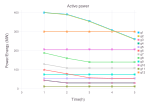

In [72]:
plot1=plot(GenPower, x = Row.index, y=Col.value(:g1,:g2,:g3,:g4,:g5,:g6,:g7,:g8,:g9,:g10,:g11,:g12),
    color=Col.index(:g1,:g2,:g3,:g4,:g5,:g6,:g7,:g8,:g9,:g10,:g11,:g12),  
    Geom.line,
    Geom.point,
    white_panel,
    Guide.XLabel("Time(h)"),
Guide.YLabel("Power/Energy (MW)"),
    Guide.colorkey(title = ""),
Guide.Title("Active power")
)

In [41]:
Qg=getvalue(q);
GenPowerQ = DataFrame();
GenPowerQ[:g1] = Qg[1,:]*Sbase;
GenPowerQ[:g2] = Qg[2,:]*Sbase;
GenPowerQ[:g3] = Qg[3,:]*Sbase;
GenPowerQ[:g4] = Qg[4,:]*Sbase;
GenPowerQ[:g5] = Qg[5,:]*Sbase;
GenPowerQ[:g6] = Qg[6,:]*Sbase;
GenPowerQ[:g7] = Qg[7,:]*Sbase;
GenPowerQ[:g8] = Qg[8,:]*Sbase;
GenPowerQ[:g9] = Qg[9,:]*Sbase;
GenPowerQ[:g10] = Qg[10,:]*Sbase;
GenPowerQ[:g11] = Qg[11,:]*Sbase;
GenPowerQ[:g12] = Qg[12,:]*Sbase;


GenPowerQ

,g1,g2,g3,g4,g5,g6,g7,g8,g9,g10,g11,g12
1,300.104,310.813,158.921,156.811,152.491,154.998,171.088,219.517,133.866,496.225,27.6734,211.482
2,299.108,310.935,158.348,156.131,150.058,154.997,170.912,219.273,132.23,493.034,25.7658,211.447
3,298.737,311.152,157.092,155.232,146.832,153.771,170.35,218.491,130.584,489.777,23.7302,211.371
4,299.051,311.444,156.193,154.642,144.76,151.365,169.84,217.78,129.4,487.438,22.6802,211.311
5,299.311,311.68,155.606,154.272,143.221,149.645,169.47,217.262,128.716,485.688,22.0098,211.269
6,300.244,311.724,155.469,154.286,142.566,148.109,169.164,216.832,128.872,484.948,21.7498,211.227
7,300.54,311.33,156.165,154.797,144.483,149.65,169.513,217.322,129.861,486.783,22.553,211.262
8,300.33,310.892,157.077,155.349,147.238,152.528,170.144,218.204,130.702,489.681,23.9578,211.332
9,301.061,310.447,159.085,156.75,152.498,154.997,170.917,219.281,132.897,495.742,27.679,211.438
10,304.026,311.626,161.278,158.396,154.999,154.999,172.165,221.005,135.68,502.803,29.9993,211.652


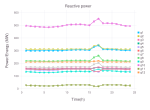

In [44]:
plot1=plot(GenPowerQ, x = Row.index, y=Col.value(:g1,:g2,:g3,:g4,:g5,:g6,:g7,:g8,:g9,:g10,:g11,:g12),
    color=Col.index(:g1,:g2,:g3,:g4,:g5,:g6,:g7,:g8,:g9,:g10,:g11,:g12),  
    Geom.line,
    Geom.point,
    white_panel,
    Guide.XLabel("Time(h)"),
Guide.YLabel("Power/Energy (MW)"),
    Guide.colorkey(title = ""),
Guide.Title("Reactive power")
)

In [79]:
PowerBalanceP = DataFrame();
PowerBalanceP[:Demand] = sum(Pload)*d[:];
PowerBalanceP[:Generation] = sum(getvalue(p[g,:]) for g=1:NG)*Sbase;
PowerBalanceP[:SOC] = sum(getvalue(SOC[i,:]) for i=1:NI)*Sbase;
PowerBalanceP[:Wind] = sum(getvalue(pw[i,:]) for i=1:NI)*Sbase;
PowerBalanceP[:Loss] = sum((getvalue(pl[l,:])+ getvalue(pl[l+NL,:]))*Sbase for l=1:NL);
PowerBalanceP

,Demand,Generation,SOC,Wind,Loss
1,1950.86,1953.95,60.0,35.4,38.4945
2,1835.75,1833.2,60.0002,39.0,36.448
3,1747.25,1726.1,60.0003,52.8,31.6542
4,1709.24,1655.68,94.1539,116.4,26.8939
5,1678.29,1599.48,151.154,162.6,23.7924
6,1704.35,1531.0,208.154,255.0,21.6434
7,1786.34,1577.57,265.154,292.8,24.0272
8,1857.47,1667.59,300.0,255.0,28.4368
9,2012.21,1830.29,300.0,217.8,35.8801
10,2242.97,1978.36,233.333,246.6,41.9877


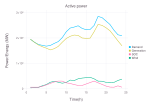

In [81]:
plot2=plot(PowerBalanceP, x = Row.index, y=Col.value(:Demand,:Generation,:SOC,:Wind),
    color=Col.index(:Demand,:Generation,:SOC,:Wind),  
    Geom.line,
    white_panel,
    
   
  
Guide.XLabel("Time(h)"),
Guide.YLabel("Power/Energy (MW)"),
Guide.Title("Active power"),
Guide.colorkey(title = "")
)

In [72]:
PowerBalanceQ = DataFrame();
PowerBalanceQ[:Demand] = sum(Qload)*d[:]/Sbase;
PowerBalanceQ[:Generation] = sum(getvalue(q[g,:]) for g=1:NG);
PowerBalanceQ[:Loss] = sum(getvalue(ql[l,:])+ getvalue(ql[l+NL,:]) for l=1:NL);
PowerBalanceQ

,Demand,Generation,Loss
1,3.97017,24.9399,20.9697
2,3.73591,24.8224,21.0865
3,3.5558,24.6712,21.1154
4,3.47845,24.559,21.0806
5,3.41547,24.4815,21.066
6,3.46851,24.4519,20.9834
7,3.63536,24.5426,20.9072
8,3.78011,24.6744,20.8942
9,4.09503,24.9279,20.8329
10,4.56464,25.1863,20.6216


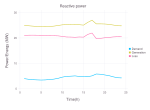

In [84]:
plot3=plot(PowerBalanceQ, x = Row.index, y=Col.value(:Demand,:Generation,:Loss),
    color=Col.index(:Demand,:Generation,:Loss),  
    Geom.line,
    white_panel,
    
   
  
Guide.XLabel("Time(h)"),
Guide.YLabel("Power/Energy (MW)"),
Guide.Title("Reactive power"),
Guide.colorkey(title = "")
)

In [122]:
set_default_plot_size(15cm, 7cm)
i=21; #there are ESS in buses 19 and 21
ESS = DataFrame();
ESS[:Charge] = getvalue(pc[i,:])*Sbase;
ESS[:Discharge] = getvalue(pd[i,:])*Sbase;
ESS[:SOC] = getvalue(SOC[i,:])*Sbase ;

ESS

,Charge,Discharge,SOC
1,2.76056e-5,1.85694e-5,20.0
2,0.000102201,1.82571e-5,20.0001
3,0.000115911,1.85566e-5,20.0002
4,12.5796,1.60198e-5,31.9507
5,19.9999,1.3292e-5,50.9506
6,20.0,1.09522e-5,69.9506
7,19.9999,1.24408e-5,88.9505
8,11.631,1.60198e-5,99.9999
9,8.83339e-5,1.9153e-5,100.0
10,5.02734e-6,20.0,77.7778


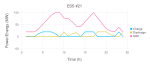

In [123]:
plot3=plot(ESS, x = Row.index, y=Col.value(:Charge,:Discharge,:SOC),
    color=Col.index(:Charge,:Discharge,:SOC),  
    Geom.line,
    white_panel,
     
  

Guide.XLabel("Time (h)"),
Guide.YLabel("Power/Energy (MW)"),
Guide.Title("ESS #$(i)"),
Guide.colorkey(title = "")
)

In [129]:

SOC_Data = DataFrame(x = collect(1:T));
N = []
for n=1:size(NESS_f,1)
    if NESS_f[n] > 0
        append!(N, n)
        Pgen = zeros(T)
        for g=1:NGen
            if Bus[g]==n
                Pgen += getvalue(p[g,:])
                
            end
        end
        SOC_Data[Symbol("Pgen$(n)")] = Pgen        
        #SOC_Data[Symbol("Pij$(n)")] = getvalue(pl[n,:])
        SOC_Data[Symbol("SOC$(n)")] = getvalue(SOC[n,:])
        SOC_Data[Symbol("Pw$(n)")] = getvalue(pw[n,:])
        SOC_Data[Symbol("Pd$(n)")] = getvalue(pd[n,:])
        SOC_Data[Symbol("Pc$(n)")] = getvalue(pc[n,:])
        SOC_Data[Symbol("Load$(n)")] = Pload[n]*d[:]/Sbase
        
        
    end
end



# for i in N
#     n = 
#     SOC_Data[Symbol("Pgen$(n)")] = getvalue(p[n,:])'
#     #SOC_Data[:'SOC$(n)'] = getvalue(SOC[n,:]
# end
SOC_Data            
            
#             @variable(m, p[g=1:NG,t=1:T]);

# @variable(m, pl[l=1:NL,t=1:T]);

# @variable(m, θ[i=1:NI,t=1:T]);
# @variable(m, Ls[i=1:NI,t=1:T]);
# @variable(m, SOC[i=1:NI,t=1:T]);
# @variable(m, pd[i=1:NI,t=1:T]);
# @variable(m, pc[i=1:NI,t=1:T]);
# @variable(m, pw[i=1:NI,t=1:T]);
# @variable(m, pwc[i=1:NI,t=1:T]);
# @variable(m, NESS[i=1:NI], Int);

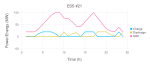

In [130]:
SOC_Data

,x,Pgen1,SOC1,Pw1,Pd1,Pc1,Load1,Pgen2,SOC2,Pw2,Pd2,Pc2,Load2,Pgen4,SOC4,Pw4,Pd4,Pc4,Load4,Pgen5,SOC5,Pw5,Pd5,Pc5,Load5,Pgen6,SOC6,Pw6,Pd6,Pc6,Load6
1,1,1.52,0.2,-2.43625e-19,1.59055e-8,4.60577e-8,0.739272,1.52,0.2,-2.48375e-19,1.5912e-8,4.619e-8,0.663976,0.0,0.04,6.67208e-20,8.24319e-9,3.89623e-8,0.506538,0.0,0.04,1.0749e-20,8.76425e-9,3.88442e-8,0.486003,0.0,0.12,2.57559e-19,5.39929e-9,3.50494e-8,0.930935
2,2,1.52,0.206277,-9.10597e-18,9.30045e-9,0.00660783,0.695653,1.52,0.225461,2.16184e-18,9.3139e-9,0.0268011,0.624799,0.0,0.0400002,-2.13927e-18,5.19033e-9,1.92388e-7,0.476651,0.0,0.0400003,-8.24549e-18,5.27179e-9,2.57638e-7,0.457327,0.0,0.12,-3.96872e-18,2.90861e-9,1.86083e-7,0.876007
3,3,1.52,0.302746,8.1524e-18,9.30055e-9,0.101546,0.662115,1.52,0.329137,6.22743e-18,9.31392e-9,0.109133,0.594677,0.0,0.040001,-3.98594e-18,4.51942e-9,8.60336e-7,0.453671,0.0,0.0400019,-7.2123e-18,4.69541e-9,1.70102e-6,0.435279,0.0,0.135627,-7.94464e-18,2.22445e-9,0.0164492,0.833774
4,4,1.52,0.433187,9.10177e-18,9.30055e-9,0.137307,0.647712,1.52,0.452175,6.84515e-18,9.31392e-9,0.129513,0.581741,0.0,0.0640844,1.33012e-17,4.31324e-9,0.0253509,0.443803,0.0,0.0624868,1.13291e-17,4.58842e-9,0.0236684,0.425811,0.0,0.204063,-1.11643e-18,2.22447e-9,0.0720377,0.815637
5,5,1.52,0.595776,1.04193e-17,9.30057e-9,0.171146,0.635984,1.52,0.595813,7.39756e-18,9.31393e-9,0.151198,0.571208,0.0,0.102084,1.01909e-17,3.73122e-9,0.0399997,0.435767,0.0,0.100486,1.88408e-17,4.27919e-9,0.0399993,0.418101,0.0,0.318058,4.30892e-17,2.19156e-9,0.119995,0.800869
6,6,1.52,0.785776,2.85017e-18,6.47036e-9,0.2,0.64586,1.52,0.785813,2.87075e-18,6.54369e-9,0.2,0.580078,0.0,0.140084,1.88907e-18,1.23688e-9,0.04,0.442534,0.0,0.138486,2.14656e-18,1.72268e-9,0.04,0.424593,0.0,0.432058,1.51446e-18,-4.74595e-11,0.12,0.813305
7,7,1.52,0.935888,9.59585e-18,9.30056e-9,0.158013,0.676929,1.52,0.92489,7.11579e-18,9.31392e-9,0.146397,0.607982,0.0,0.178084,5.72014e-18,2.81239e-9,0.0399999,0.463822,0.0,0.176486,7.88932e-18,3.43584e-9,0.0399998,0.445018,0.0,0.546058,5.84199e-18,1.4132e-9,0.12,0.852429
8,8,1.52,1.0,7.35814e-18,9.30054e-9,0.0674858,0.703883,1.52,1.0,5.50583e-18,9.31391e-9,0.0790629,0.632191,0.0,0.2,1.2259e-17,4.31323e-9,0.0230695,0.48229,0.0,0.2,1.18241e-17,4.58842e-9,0.0247516,0.462738,0.0,0.6,-2.07624e-18,2.22447e-9,0.0567808,0.886371
9,9,1.52,1.0,-6.05286e-18,1.58875e-8,4.99803e-8,0.762522,1.52,1.0,-6.05656e-18,1.5859e-8,5.03468e-8,0.684858,0.0,0.2,-5.7584e-18,9.23683e-9,3.74399e-8,0.522469,0.0,0.2,-5.82515e-18,9.44176e-9,3.91023e-8,0.501288,0.0,0.6,-5.60488e-18,6.21234e-9,3.33445e-8,0.960213
10,10,1.52,1.0,2.60856e-18,2.31231e-7,6.39567e-9,0.849968,1.52,1.0,2.70816e-18,2.36471e-7,6.37567e-9,0.763397,0.0,0.2,1.15323e-18,1.76411e-7,3.49313e-9,0.582385,0.0,0.2,1.79967e-18,1.92626e-7,3.53139e-9,0.558775,0.0,0.6,8.24144e-19,1.85677e-7,1.76035e-9,1.07033


In [131]:
n=1
SOC_Data_sort = stack(SOC_Data, (n+1):(6*n+1))

,variable,value,x,Pgen2,SOC2,Pw2,Pd2,Pc2,Load2,Pgen4,SOC4,Pw4,Pd4,Pc4,Load4,Pgen5,SOC5,Pw5,Pd5,Pc5,Load5,Pgen6,SOC6,Pw6,Pd6,Pc6,Load6
1,Pgen1,1.52,1,1.52,0.2,-2.48375e-19,1.5912e-8,4.619e-8,0.663976,0.0,0.04,6.67208e-20,8.24319e-9,3.89623e-8,0.506538,0.0,0.04,1.0749e-20,8.76425e-9,3.88442e-8,0.486003,0.0,0.12,2.57559e-19,5.39929e-9,3.50494e-8,0.930935
2,Pgen1,1.52,2,1.52,0.225461,2.16184e-18,9.3139e-9,0.0268011,0.624799,0.0,0.0400002,-2.13927e-18,5.19033e-9,1.92388e-7,0.476651,0.0,0.0400003,-8.24549e-18,5.27179e-9,2.57638e-7,0.457327,0.0,0.12,-3.96872e-18,2.90861e-9,1.86083e-7,0.876007
3,Pgen1,1.52,3,1.52,0.329137,6.22743e-18,9.31392e-9,0.109133,0.594677,0.0,0.040001,-3.98594e-18,4.51942e-9,8.60336e-7,0.453671,0.0,0.0400019,-7.2123e-18,4.69541e-9,1.70102e-6,0.435279,0.0,0.135627,-7.94464e-18,2.22445e-9,0.0164492,0.833774
4,Pgen1,1.52,4,1.52,0.452175,6.84515e-18,9.31392e-9,0.129513,0.581741,0.0,0.0640844,1.33012e-17,4.31324e-9,0.0253509,0.443803,0.0,0.0624868,1.13291e-17,4.58842e-9,0.0236684,0.425811,0.0,0.204063,-1.11643e-18,2.22447e-9,0.0720377,0.815637
5,Pgen1,1.52,5,1.52,0.595813,7.39756e-18,9.31393e-9,0.151198,0.571208,0.0,0.102084,1.01909e-17,3.73122e-9,0.0399997,0.435767,0.0,0.100486,1.88408e-17,4.27919e-9,0.0399993,0.418101,0.0,0.318058,4.30892e-17,2.19156e-9,0.119995,0.800869
6,Pgen1,1.52,6,1.52,0.785813,2.87075e-18,6.54369e-9,0.2,0.580078,0.0,0.140084,1.88907e-18,1.23688e-9,0.04,0.442534,0.0,0.138486,2.14656e-18,1.72268e-9,0.04,0.424593,0.0,0.432058,1.51446e-18,-4.74595e-11,0.12,0.813305
7,Pgen1,1.52,7,1.52,0.92489,7.11579e-18,9.31392e-9,0.146397,0.607982,0.0,0.178084,5.72014e-18,2.81239e-9,0.0399999,0.463822,0.0,0.176486,7.88932e-18,3.43584e-9,0.0399998,0.445018,0.0,0.546058,5.84199e-18,1.4132e-9,0.12,0.852429
8,Pgen1,1.52,8,1.52,1.0,5.50583e-18,9.31391e-9,0.0790629,0.632191,0.0,0.2,1.2259e-17,4.31323e-9,0.0230695,0.48229,0.0,0.2,1.18241e-17,4.58842e-9,0.0247516,0.462738,0.0,0.6,-2.07624e-18,2.22447e-9,0.0567808,0.886371
9,Pgen1,1.52,9,1.52,1.0,-6.05656e-18,1.5859e-8,5.03468e-8,0.684858,0.0,0.2,-5.7584e-18,9.23683e-9,3.74399e-8,0.522469,0.0,0.2,-5.82515e-18,9.44176e-9,3.91023e-8,0.501288,0.0,0.6,-5.60488e-18,6.21234e-9,3.33445e-8,0.960213
10,Pgen1,1.52,10,1.52,1.0,2.70816e-18,2.36471e-7,6.37567e-9,0.763397,0.0,0.2,1.15323e-18,1.76411e-7,3.49313e-9,0.582385,0.0,0.2,1.79967e-18,1.92626e-7,3.53139e-9,0.558775,0.0,0.6,8.24144e-19,1.85677e-7,1.76035e-9,1.07033


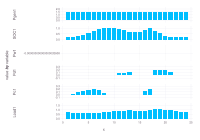

In [132]:
n=1
n=N[n]
set_default_plot_size(20cm, 14cm)
#plot(SOC_Data_sort, ygroup=(Symbol("Зпут$(n)"),Symbol("SOC$(n)"),Symbol("Pw$(n)"),Symbol("Pd$(n)"),Symbol("Pc$(n)"), x="x", y="value", Geom.subplot_grid(Geom.point))
plot(SOC_Data_sort, ygroup="variable", x="x", y="value", Geom.subplot_grid(Geom.bar,free_y_axis=true),
Theme(bar_spacing=1mm))

In [191]:

Line_Data = DataFrame(x = collect(1:T));
N_L = []
for n=1:size(NESS_f,1)
    if NESS_f[n] > 0
        
       
        for l=1:NLines 
            if (Nodes[l,1]==n) | (Nodes[l,2]==n)
                if !(l in N_L)
                    append!(N_L, l)
                    Line_Data[Symbol("P$(Nodes[l,1]),$(Nodes[l,2])")] = getvalue(pl[l,:])
               end
            end
        end
    end
end

Line_Data

,x,"P1,2","P1,3","P1,5","P2,4","P2,6","P4,9","P5,10","P6,10","P3,24","P15,24"
1,1,-0.0110627,0.230122,0.561669,0.406872,0.43809,-0.0996669,0.0756657,-0.492846,-0.938635,0.938635
2,2,-0.00691957,0.252502,0.572157,0.419574,0.441906,-0.0570767,0.114829,-0.434101,-0.854956,0.854956
3,3,-0.00691211,0.226559,0.536693,0.39011,0.419168,-0.063562,0.101412,-0.431056,-0.834027,0.834027
4,4,-0.00691192,0.211058,0.530835,0.382667,0.419167,-0.0864869,0.0813564,-0.468508,-0.825132,0.825132
5,5,-0.00691149,0.196933,0.522849,0.372044,0.418639,-0.103723,0.0647488,-0.502225,-0.818449,0.818449
6,6,0.00071291,0.184839,0.488588,0.345152,0.395483,-0.137382,0.023995,-0.537822,-0.811394,0.811394
7,7,-0.00691179,0.192764,0.499206,0.353308,0.405401,-0.150514,0.0141877,-0.567028,-0.837534,0.837534
8,8,-0.00691215,0.224709,0.530835,0.382667,0.419167,-0.122693,0.0433459,-0.523984,-0.849321,0.849321
9,9,-0.0146365,0.228873,0.543241,0.39316,0.427345,-0.129309,0.0419529,-0.532868,-0.940003,0.940003
10,10,-0.000192306,0.166213,0.504012,0.350427,0.405984,-0.231958,-0.054763,-0.664345,-1.12635,1.12635


In [174]:
Line_Data_sort = stack(Line_Data, 2:size(Line_Data,2))

,variable,value,x
1,"P1,2",-0.0110627,1
2,"P1,2",-0.00691957,2
3,"P1,2",-0.00691211,3
4,"P1,2",-0.00691192,4
5,"P1,2",-0.00691149,5
6,"P1,2",0.00071291,6
7,"P1,2",-0.00691179,7
8,"P1,2",-0.00691215,8
9,"P1,2",-0.0146365,9
10,"P1,2",-0.000192306,10


In [175]:
sp = unique(Line_Data_sort[:variable])
Dhl = DataFrame(x = 1:size(N_L,1),yint = N_L, variable = sp)
for l=1:NL
    if l in Dhl[:yint]
        Dhl[:lim] = SLmax[l]/Sbase
    end
end
Dhl

,x,yint,variable,lim
1,1,1,"P1,2",1.75
2,2,2,"P1,3",1.75
3,3,3,"P1,5",1.75
4,4,4,"P2,4",1.75
5,5,5,"P2,6",1.75
6,6,8,"P4,9",1.75
7,7,9,"P5,10",1.75
8,8,10,"P6,10",1.75


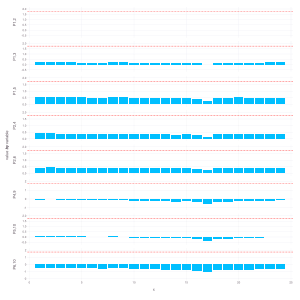

In [176]:
set_default_plot_size(30cm, 30cm)
#plot(SOC_Data_sort, ygroup=(Symbol("Зпут$(n)"),Symbol("SOC$(n)"),Symbol("Pw$(n)"),Symbol("Pd$(n)"),Symbol("Pc$(n)"), x="x", y="value", Geom.subplot_grid(Geom.point))
plot(Line_Data_sort, ygroup="variable", x="x", y="value", 
    Geom.subplot_grid(
        layer(Geom.bar),
        layer(Dhl, ygroup=:variable, yintercept=:lim, Geom.hline(color="red", style=:dot)),
        free_y_axis=true),
# xintercept=[42, 138],
# Geom.vline(color =["red"],style=[:dash]),
Theme(bar_spacing=1mm))

In [195]:
N_L_full = []
Line_Data_full = DataFrame(x = collect(1:T));
for n=1:NBuses
    for l=1:NLines 
        if (Nodes[l,1]==n) | (Nodes[l,2]==n)
            if !(l in N_L_full)
                append!(N_L_full, l)
                Line_Data_full[Symbol("P$(Nodes[l,1]),$(Nodes[l,2])")] = getvalue(pl[l,:])
            end
        end
    end
    
end

Line_Data_sort_full = stack(Line_Data_full, 2:size(Line_Data_full,2))

,variable,value,x
1,"P1,2",-0.0110627,1
2,"P1,2",-0.00691957,2
3,"P1,2",-0.00691211,3
4,"P1,2",-0.00691192,4
5,"P1,2",-0.00691149,5
6,"P1,2",0.00071291,6
7,"P1,2",-0.00691179,7
8,"P1,2",-0.00691215,8
9,"P1,2",-0.0146365,9
10,"P1,2",-0.000192306,10


In [196]:
sp1 = unique(Line_Data_sort_full[:variable])
Dhl1 = DataFrame(x = 1:size(N_L,1),yint = N_L, variable = sp1)
for l=1:NL
    if l in Dhl1[:yint]
        Dhl1[:lim] = SLmax[l]/Sbase
    end
end


,x,yint,variable,lim
1,1,1,"P1,2",5.0
2,2,2,"P1,3",5.0
3,3,3,"P1,5",5.0
4,4,4,"P2,4",5.0
5,5,5,"P2,6",5.0
6,6,8,"P3,9",5.0
7,7,9,"P3,24",5.0
8,8,10,"P4,9",5.0
9,9,6,"P5,10",5.0
10,10,7,"P6,10",5.0


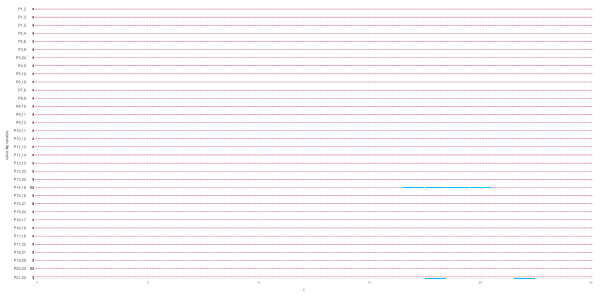

In [198]:
set_default_plot_size(0cm, 30cm)
#plot(SOC_Data_sort, ygroup=(Symbol("Зпут$(n)"),Symbol("SOC$(n)"),Symbol("Pw$(n)"),Symbol("Pd$(n)"),Symbol("Pc$(n)"), x="x", y="value", Geom.subplot_grid(Geom.point))
plot(Line_Data_sort_full, ygroup="variable", x="x", y="value", 
    Geom.subplot_grid(
        layer(Geom.bar),
        layer(Dhl1, ygroup=:variable, yintercept=:lim, Geom.hline(color="red", style=:dot)),
        free_y_axis=true),
# xintercept=[42, 138],
# Geom.vline(color =["red"],style=[:dash]),
Theme(bar_spacing=1mm))

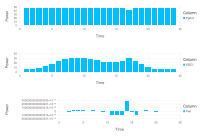

In [74]:
n = 1
n = N[n]
p1=plot(SOC_Data, x = Row.index, y=Col.value(Symbol("Pgen$(n)")),  
    color=Col.index(Symbol("Pgen$(n)")),
    Geom.bar,
   
    Guide.YLabel("Power"),
    Theme(bar_spacing=1mm),
    #Guide.Title("Title"),
    Guide.XLabel("Time"),
    )
p2=plot(SOC_Data, x = Row.index, y=Col.value(Symbol("SOC$(n)")),  
    color=Col.index(Symbol("SOC$(n)")),
    Geom.bar,
   
    Guide.YLabel("Power"),
    Theme(bar_spacing=1mm),
    #Guide.Title("Title"),
    Guide.XLabel("Time"),
    )

p3=plot(SOC_Data, x = Row.index, y=Col.value(Symbol("Pw$(n)")),  
    color=Col.index(Symbol("Pw$(n)")),
    Geom.bar,
   
    Guide.YLabel("Power"),
    Theme(bar_spacing=1mm),
    #Guide.Title("Title"),
    Guide.XLabel("Time"),
    )

vstack(p1,p2,p3)
 
#,Symbol("SOC$(n)"),Symbol("Pw$(n)"),Symbol("Pd$(n)"),Symbol("Pc$(n)")

In [106]:
getvalue(Ls)

24×24 Array{Float64,2}:
 -9.99088e-9   -9.99088e-9   -9.99088e-9   …  -9.99088e-9   -9.99088e-9 
 -9.99088e-9   -9.99088e-9   -9.99088e-9      -9.99088e-9   -9.99088e-9 
 -9.99087e-9   -9.99087e-9   -9.99088e-9      -9.99087e-9   -9.99087e-9 
 -9.99087e-9   -9.99087e-9   -9.99087e-9      -9.99087e-9   -9.99087e-9 
 -9.99087e-9   -9.99087e-9   -9.99088e-9      -9.99087e-9   -9.99087e-9 
 -9.99086e-9   -9.99087e-9   -9.99087e-9   …  -9.99087e-9   -9.99087e-9 
 -9.99089e-9   -9.99089e-9   -9.99089e-9      -9.99089e-9   -9.99089e-9 
 -9.99088e-9   -9.99088e-9   -9.99088e-9      -9.99089e-9   -9.99089e-9 
 -9.99087e-9   -9.99088e-9   -9.99088e-9      -9.99088e-9   -9.99088e-9 
 -9.99087e-9   -9.99087e-9   -9.99087e-9      -9.99087e-9   -9.99087e-9 
  1.88705e-18  -4.94043e-18  -8.42416e-19  …   7.79539e-19   2.25251e-18
  2.75238e-18  -6.03205e-18  -6.67944e-19      7.70805e-19   2.48623e-18
 -9.99089e-9   -9.99089e-9   -9.99089e-9      -9.9909e-9    -9.99089e-9 
 -9.99088e-9   -9.99089e-9 

In [121]:
using DataFrames
set_default_plot_size(8cm, 12cm)

widedf = DataFrame(x = collect(1:10), var1 = collect(1:10), var2 = collect(1:10).^2)


,variable,value,x
1,var1,1,1
2,var1,2,2
3,var1,3,3
4,var1,4,4
5,var1,5,5
6,var1,6,6
7,var1,7,7
8,var1,8,8
9,var1,9,9
10,var1,10,10


In [123]:
plot(longdf, ygroup="var", x="x", y="value", Geom.subplot_grid(Geom.point))


LoadError: [91mKeyError: key :var1 not found[39m

In [67]:
l=1
n=1
Nodes[l,1]==n | Nodes[l,2]==n

false

In [71]:
Symbol("P$(Nodes[l,1])$(Nodes[l,2])")

:P12

In [2]:
norm([1,2,3])

3.7416573867739413

In [18]:
norm(2*sqrt(r_loss)*(pd[i,t]+pc[i,t]),1-ESS_loss[i,t]) <= 1+ESS_loss[i,t]

LoadError: [91mUndefVarError: i not defined[39m